# 1. Install Dependencies and Setup

In [ ]:
!pip install tensorflow tensorflow-gpu opencv-python matplotlib

In [ ]:
!pip list

In [ ]:
import tensorflow as tf
import os

In [ ]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [ ]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# 2. Remove dodgy images

In [ ]:
import cv2
import imghdr

In [ ]:
data_dir = 'data'

In [ ]:
image_exts = ['jpeg','jpg', 'bmp', 'png']

In [ ]:
for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))
            # os.remove(image_path)

# 3. Load Data

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = tf.keras.utils.image_dataset_from_directory('/content/drive/MyDrive/daots')

Found 317 files belonging to 2 classes.


In [ ]:
data_iterator = data.as_numpy_iterator()

In [ ]:
batch = data_iterator.next()

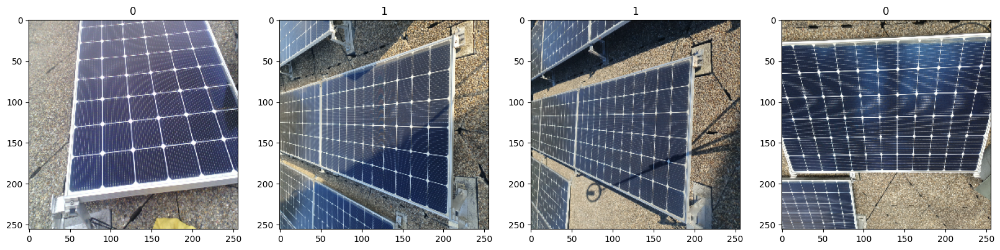

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

# 4. Scale Data

In [ ]:
data = data.map(lambda x,y: (x/255, y))

In [ ]:
data.as_numpy_iterator().next()

(array([[[[0.78431374, 0.79901963, 0.75686276],
          [0.75      , 0.7441176 , 0.69803923],
          [0.7862745 , 0.7764706 , 0.6960784 ],
          ...,
          [0.59607846, 0.6313726 , 0.6901961 ],
          [0.59411764, 0.64509803, 0.69803923],
          [0.57843137, 0.62941176, 0.68235296]],
 
         [[0.7794118 , 0.7764706 , 0.7107843 ],
          [0.7764706 , 0.76960784, 0.7362745 ],
          [0.77156866, 0.75      , 0.6911765 ],
          ...,
          [0.6       , 0.62941176, 0.6745098 ],
          [0.6068627 , 0.6617647 , 0.69215685],
          [0.60588235, 0.6392157 , 0.70980394]],
 
         [[0.7588235 , 0.7588235 , 0.67745095],
          [0.8245098 , 0.8186275 , 0.76960784],
          [0.78431374, 0.7794118 , 0.7176471 ],
          ...,
          [0.58137256, 0.64411765, 0.6990196 ],
          [0.5872549 , 0.6382353 , 0.6911765 ],
          [0.60588235, 0.64509803, 0.69215685]],
 
         ...,
 
         [[0.87941176, 0.922549  , 0.9343137 ],
          [0.90294

# 5. Split Data

In [ ]:
train_size = int(len(data)*.7)
val_size = int(len(data)*.2)
test_size = int(len(data)*.1)

In [ ]:
train_size

7

In [ ]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

# 6. Build Deep Learning Model

In [ ]:
train

<_TakeDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [ ]:
model = Sequential()

In [ ]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3)))
model.add(MaxPooling2D())
model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [ ]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [ ]:
modeloCNN=tf.keras.models.Sequential([


    tf.keras.layers.Conv2D(32,(3,3),activation='relu',input_shape=(256,256,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),


    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

In [ ]:
modeloCNN.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
modeloCNN.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 30, 30, 128)      

In [ ]:
modeloDenson=tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(256,256,3)),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(150,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid'),

])

In [ ]:
modeloDenson.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

# 7. Train

In [ ]:
logdir='logs'

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
hist=modeloCNN.fit(train,epochs=10,validation_data=val,callbacks=[tensorboard_callback])

Epoch 1/10
7/7 [==============================] - 25s 2s/step - loss: 1.8237 - accuracy: 0.4598 - val_loss: 0.6885 - val_accuracy: 0.4219
Epoch 2/10
7/7 [==============================] - 16s 2s/step - loss: 0.6696 - accuracy: 0.5536 - val_loss: 0.6127 - val_accuracy: 0.5781
Epoch 3/10
7/7 [==============================] - 18s 2s/step - loss: 0.3939 - accuracy: 0.8259 - val_loss: 0.4530 - val_accuracy: 0.7812
Epoch 4/10
7/7 [==============================] - 16s 1s/step - loss: 0.3282 - accuracy: 0.8750 - val_loss: 0.1833 - val_accuracy: 0.9062
Epoch 5/10
7/7 [==============================] - 16s 1s/step - loss: 0.2253 - accuracy: 0.9018 - val_loss: 0.1899 - val_accuracy: 0.9531
Epoch 6/10
7/7 [==============================] - 16s 1s/step - loss: 0.1387 - accuracy: 0.9732 - val_loss: 0.0651 - val_accuracy: 1.0000
Epoch 7/10
7/7 [==============================] - 16s 1s/step - loss: 0.0720 - accuracy: 0.9955 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 8/10
7/7 [==================

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# 8. Plot Performance

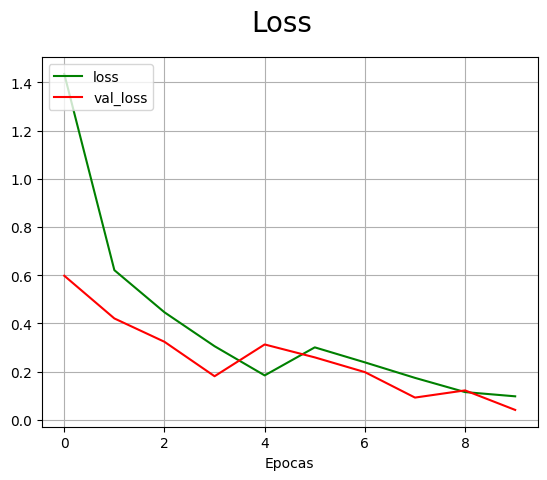

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='green', label='loss')
plt.plot(hist.history['val_loss'], color='red', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.xlabel("Epocas")
plt.grid()
plt.show()

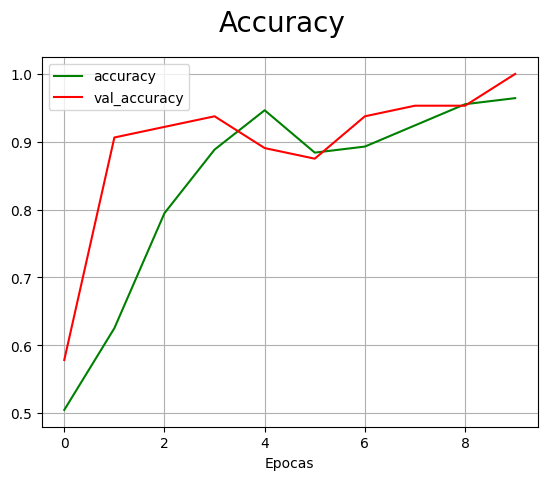

In [ ]:
fig = plt.figure()

plt.plot(hist.history['accuracy'], color='green', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='red', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.xlabel("Epocas")
plt.grid()
plt.show()

# 9. Evaluate

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

In [ ]:
pre = Precision()
re = Recall()
acc = BinaryAccuracy()

In [ ]:
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = modeloCNN.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 1s 764ms/step


# 10. Test

In [ ]:
import cv2

In [ ]:

img= cv2.imread('/content/sombras-panel-solar.jpg')


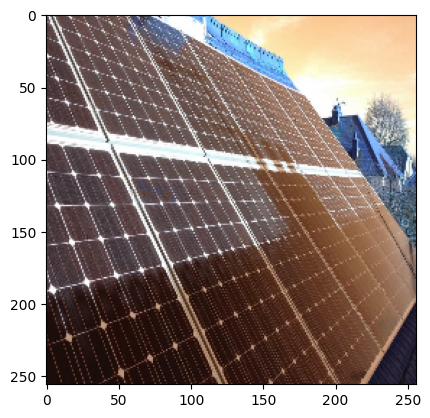

In [ ]:
resize = tf.image.resize(img, (256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()

In [ ]:
yhat = modeloCNN.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 0s 18ms/step


In [ ]:
yhat

array([[0.30440068]], dtype=float32)

In [ ]:
if yhat > 0.5:
    print(f'Predicted class is Shadow')
else:
    print(f'Predicted class is light')

Predicted class is light


In [ ]:
imgurls=!ls -1 '/content/drive/MyDrive/daots/sombra'
ruta='/content/drive/MyDrive/daots/sombra/'

# 11. Save the Model

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
modeloCNN.save('Detector_de_sombras.keras')

In [ ]:
new_model = load_model('Detector_de_sombras.h5')

In [ ]:
new_model.predict(np.expand_dims(resize/255, 0))

array([[0.01972741]], dtype=float32)